In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented"
x = load(os.path.join(path, 'train/monumentimage_10000.jpg'))
print(x.shape)

(1365, 2048, 3)


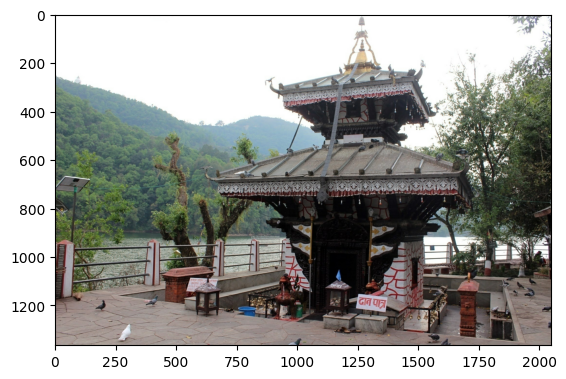

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

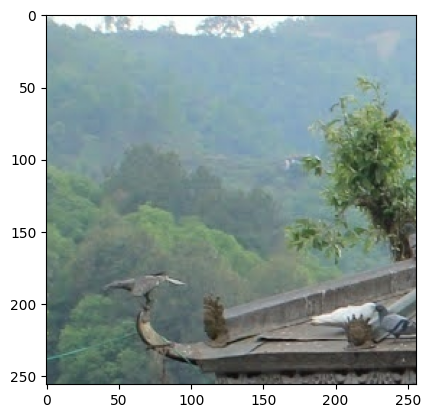

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

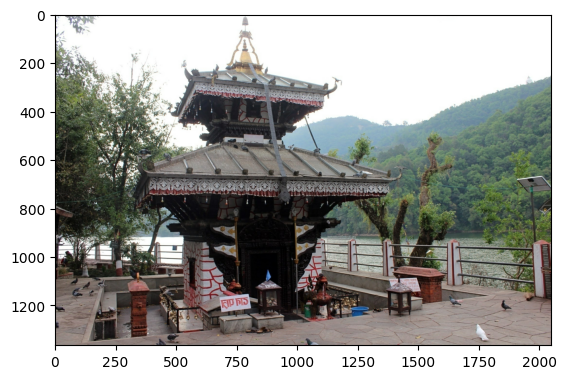

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

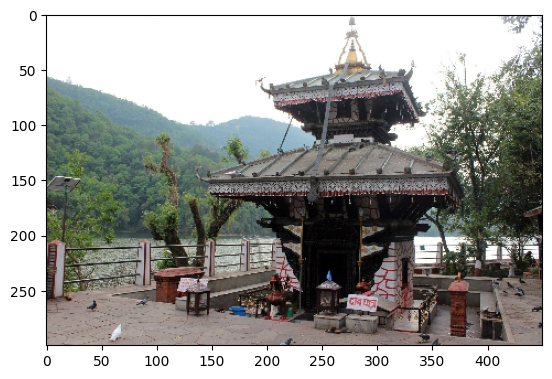

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 500)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "/train/*")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
validation_dataset = tf.data.Dataset.list_files(path + '/val/*')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 683, 1024, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 1366, 2048, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

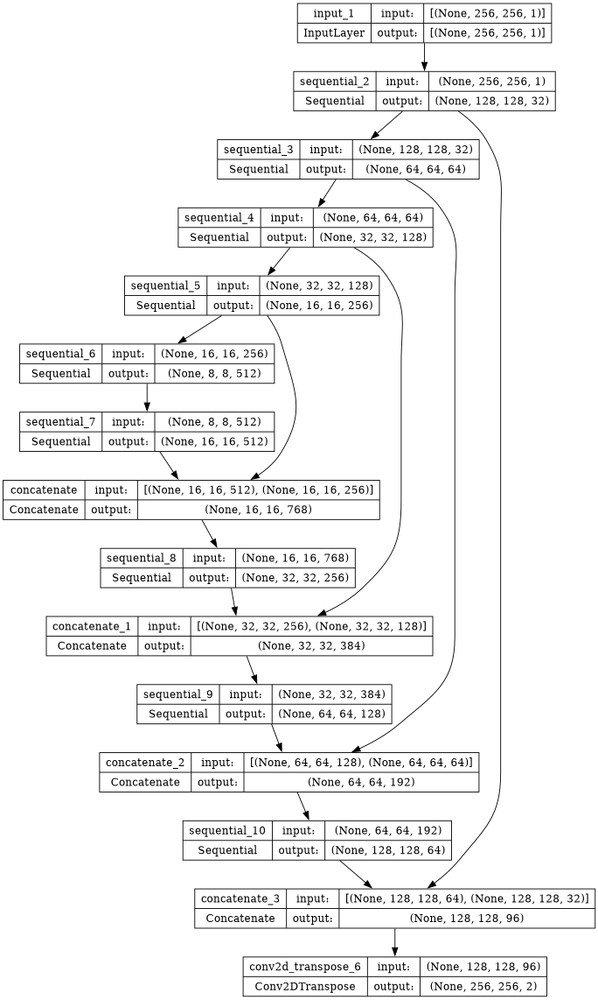

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
gen.load_weights('/kaggle/input/feb21-flexible-resizeplaces365/modelsFeb7/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

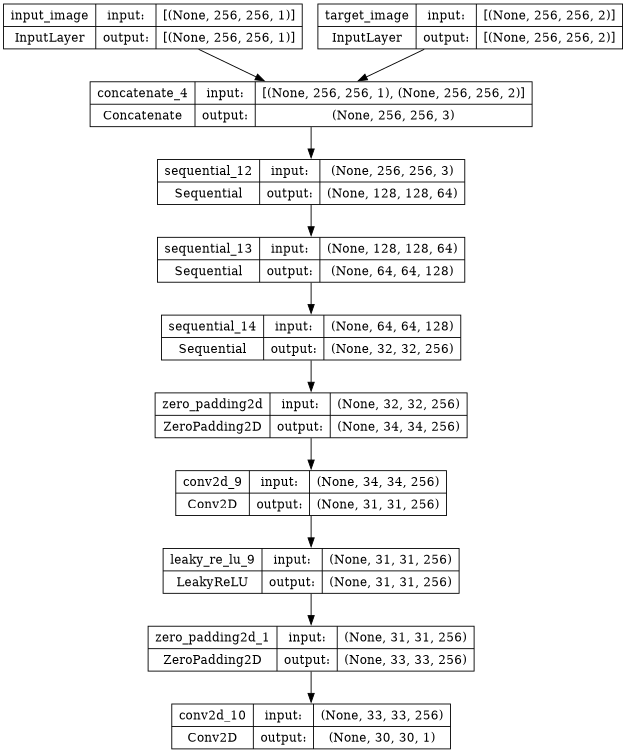

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
disc.load_weights('/kaggle/input/feb21-flexible-resizeplaces365/modelsFeb7/disc_wweight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 100

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#         rgb_target = create_rgb_image(input_image, target)
#         rgb_generated = create_rgb_image(input_image, gen_output)
#         ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#         psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, tf.constant([0]), tf.constant([0]), tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


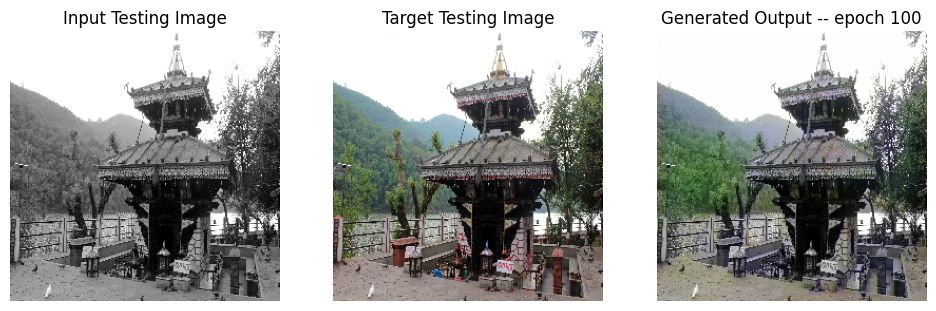

SSIM Score: 0.9725926518440247
PSNR Score: 29.163068771362305


In [47]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/train/monumentimage_10000.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10204.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 4s 0us/step
Training Details
Generator-- total_loss:5.59946 gan_loss:0.92916 l1_loss:0.04144 perceptual_loss:0.00658 Discriminator-- total_loss:1.55607 real_loss:0.75384 generated_loss:0.80223 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 1 is 657.6692354679108 sec
Number of iteration 525
Validation Details
Generator-- total_loss:12.02337 gan_loss:1.24539 l1_loss:0.09673  perceptual_loss:0.01381 Discriminator-- total_loss:1.08007 real_loss:0.50590 generated_loss:0.57417 --- SSIM 0.73896 PSNR 15.77171 LPIPS 0.00000
Time taken for epoch 1 is 706.6317298412323 sec
Number of iteration 70
Displaying one random test image...


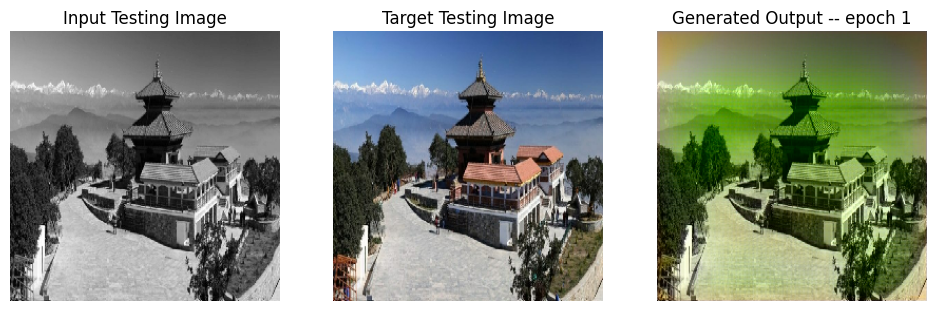

SSIM Score: 0.8013482689857483
PSNR Score: 14.961841583251953
Epoch 1
Training Details
Generator-- total_loss:5.59828 gan_loss:0.89921 l1_loss:0.04167 perceptual_loss:0.00665 Discriminator-- total_loss:1.33093 real_loss:0.65324 generated_loss:0.67770 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 2 is 645.7615430355072 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.94659 gan_loss:1.07691 l1_loss:0.05126  perceptual_loss:0.00929 Discriminator-- total_loss:1.41471 real_loss:0.46358 generated_loss:0.95114 --- SSIM 0.91038 PSNR 21.26217 LPIPS 0.00000
Time taken for epoch 2 is 692.2009565830231 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:5.44847 gan_loss:0.90198 l1_loss:0.04026 perceptual_loss:0.00650 Discriminator-- total_loss:1.33254 real_loss:0.65418 generated_loss:0.67836 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 3 is 651.315482378006 sec
Number of iteration 525
Validation Details
Generator-

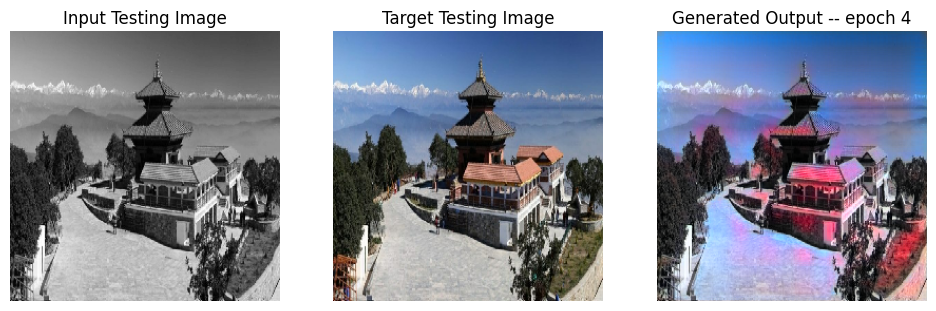

SSIM Score: 0.9291092753410339
PSNR Score: 21.603731155395508
Epoch 4
Training Details
Generator-- total_loss:5.38722 gan_loss:0.90950 l1_loss:0.03967 perceptual_loss:0.00638 Discriminator-- total_loss:1.31314 real_loss:0.64866 generated_loss:0.66449 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 5 is 624.3873641490936 sec
Number of iteration 525
Validation Details
Generator-- total_loss:5.78466 gan_loss:0.48971 l1_loss:0.04551  perceptual_loss:0.00930 Discriminator-- total_loss:1.68060 real_loss:1.05689 generated_loss:0.62371 --- SSIM 0.93987 PSNR 22.94256 LPIPS 0.00000
Time taken for epoch 5 is 670.7835314273834 sec
Number of iteration 70
Epoch 5
Training Details
Generator-- total_loss:5.41048 gan_loss:0.93143 l1_loss:0.03964 perceptual_loss:0.00644 Discriminator-- total_loss:1.32687 real_loss:0.65626 generated_loss:0.67061 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 6 is 640.9579215049744 sec
Number of iteration 525
Validation Details
Generator

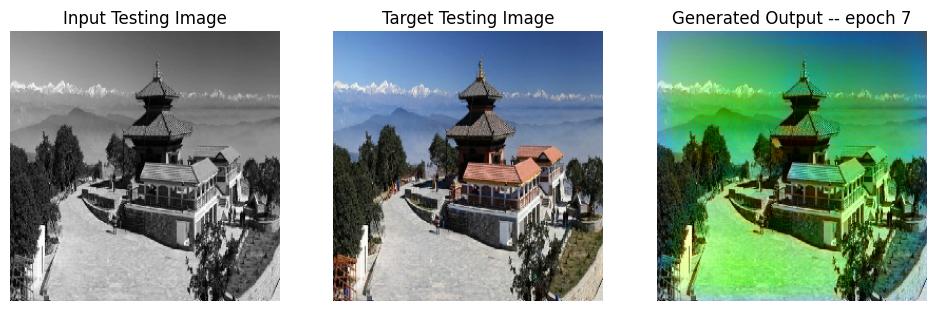

SSIM Score: 0.752648115158081
PSNR Score: 15.333629608154297
Epoch 7
Training Details
Generator-- total_loss:5.34640 gan_loss:0.92760 l1_loss:0.03905 perceptual_loss:0.00642 Discriminator-- total_loss:1.29692 real_loss:0.63773 generated_loss:0.65919 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 8 is 642.328818321228 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.65370 gan_loss:0.69353 l1_loss:0.05141  perceptual_loss:0.01024 Discriminator-- total_loss:1.60542 real_loss:0.83091 generated_loss:0.77450 --- SSIM 0.92409 PSNR 21.68591 LPIPS 0.00000
Time taken for epoch 8 is 689.2711350917816 sec
Number of iteration 70
Epoch 8
Training Details
Generator-- total_loss:5.36430 gan_loss:0.91759 l1_loss:0.03933 perceptual_loss:0.00642 Discriminator-- total_loss:1.29634 real_loss:0.63580 generated_loss:0.66054 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 9 is 635.4160153865814 sec
Number of iteration 525
Validation Details
Generator--

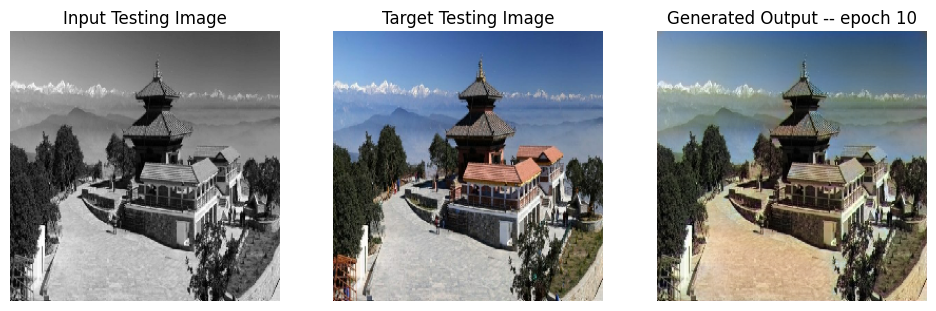

SSIM Score: 0.964765727519989
PSNR Score: 23.362890243530273
Epoch 10
Training Details
Generator-- total_loss:4.49993 gan_loss:0.43747 l1_loss:0.03568 perceptual_loss:0.00618 Discriminator-- total_loss:1.61948 real_loss:1.18685 generated_loss:0.43263 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 11 is 548.8882007598877 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.62655 gan_loss:0.41526 l1_loss:0.05331  perceptual_loss:0.01101 Discriminator-- total_loss:1.72231 real_loss:1.29350 generated_loss:0.42882 --- SSIM 0.92212 PSNR 20.50389 LPIPS 0.00000
Time taken for epoch 11 is 595.4848923683167 sec
Number of iteration 70
Epoch 11
Training Details
Generator-- total_loss:11.91102 gan_loss:7.87542 l1_loss:0.03552 perceptual_loss:0.00604 Discriminator-- total_loss:0.08394 real_loss:0.03934 generated_loss:0.04460 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 12 is 412.40737676620483 sec
Number of iteration 525
Validation Details
Gen

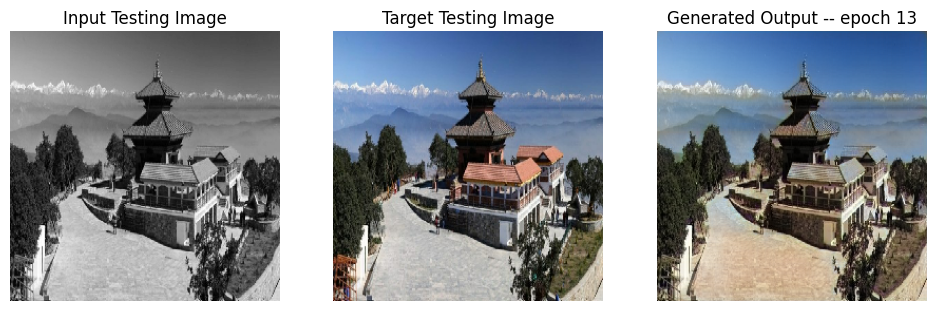

SSIM Score: 0.9689729809761047
PSNR Score: 26.022329330444336
Epoch 13
Training Details
Generator-- total_loss:14.23059 gan_loss:10.21345 l1_loss:0.03536 perceptual_loss:0.00601 Discriminator-- total_loss:0.00210 real_loss:0.00099 generated_loss:0.00112 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 14 is 413.4305884838104 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.53140 gan_loss:1.59236 l1_loss:0.04230  perceptual_loss:0.00886 Discriminator-- total_loss:1.25919 real_loss:0.57683 generated_loss:0.68236 --- SSIM 0.94190 PSNR 22.80680 LPIPS 0.00000
Time taken for epoch 14 is 459.9128487110138 sec
Number of iteration 70
Epoch 14
Training Details
Generator-- total_loss:15.11411 gan_loss:11.06509 l1_loss:0.03564 perceptual_loss:0.00606 Discriminator-- total_loss:0.41757 real_loss:0.19761 generated_loss:0.21995 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 15 is 417.8840892314911 sec
Number of iteration 525
Validation Details


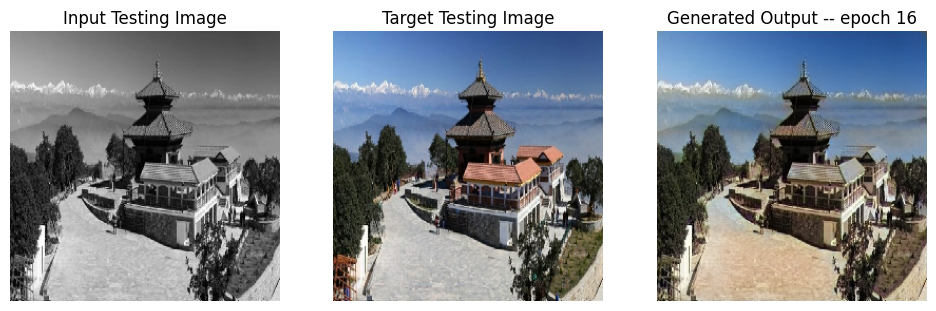

SSIM Score: 0.9688537120819092
PSNR Score: 25.913021087646484
Epoch 16
Training Details
Generator-- total_loss:14.44583 gan_loss:10.42000 l1_loss:0.03543 perceptual_loss:0.00603 Discriminator-- total_loss:0.03324 real_loss:0.01447 generated_loss:0.01877 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 17 is 417.09446120262146 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.15162 gan_loss:3.26004 l1_loss:0.04194  perceptual_loss:0.00872 Discriminator-- total_loss:2.43258 real_loss:0.68719 generated_loss:1.74539 --- SSIM 0.94252 PSNR 22.94241 LPIPS 0.00000
Time taken for epoch 17 is 464.04210662841797 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:14.59394 gan_loss:10.56191 l1_loss:0.03548 perceptual_loss:0.00605 Discriminator-- total_loss:0.00739 real_loss:0.00432 generated_loss:0.00307 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 18 is 418.81001257896423 sec
Number of iteration 525
Validation Detai

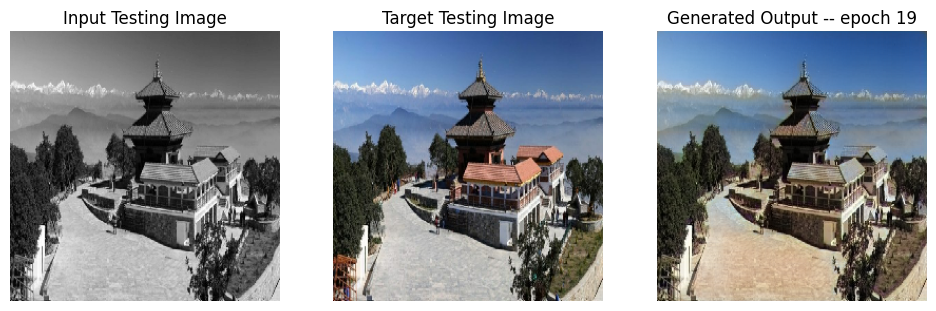

SSIM Score: 0.9689686894416809
PSNR Score: 25.95256996154785
Epoch 19
Training Details
Generator-- total_loss:14.97430 gan_loss:10.92990 l1_loss:0.03561 perceptual_loss:0.00604 Discriminator-- total_loss:0.03744 real_loss:0.03041 generated_loss:0.00703 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 20 is 412.16873836517334 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.02029 gan_loss:1.09468 l1_loss:0.04219  perceptual_loss:0.00883 Discriminator-- total_loss:1.50364 real_loss:0.86961 generated_loss:0.63403 --- SSIM 0.94214 PSNR 22.86125 LPIPS 0.00000
Time taken for epoch 20 is 458.61946511268616 sec
Number of iteration 70
Epoch 20
Training Details
Generator-- total_loss:15.41927 gan_loss:11.37379 l1_loss:0.03559 perceptual_loss:0.00608 Discriminator-- total_loss:0.00015 real_loss:0.00009 generated_loss:0.00006 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 21 is 410.5200901031494 sec
Number of iteration 525
Validation Details

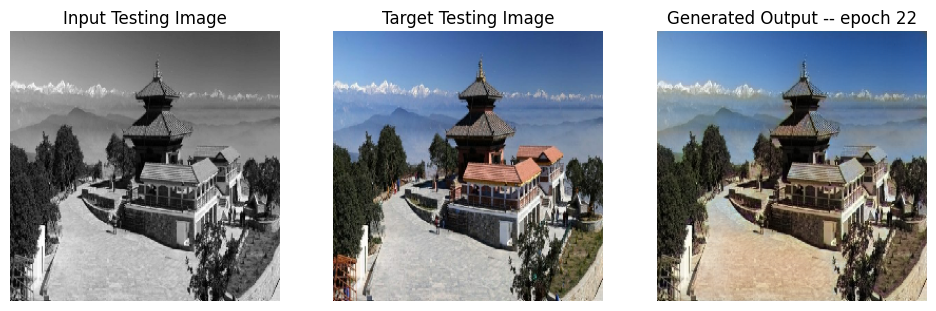

SSIM Score: 0.9688034057617188
PSNR Score: 25.864517211914062
Epoch 22
Training Details
Generator-- total_loss:17.22781 gan_loss:13.18044 l1_loss:0.03560 perceptual_loss:0.00609 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 23 is 410.4430754184723 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.30036 gan_loss:1.32942 l1_loss:0.04256  perceptual_loss:0.00894 Discriminator-- total_loss:1.58724 real_loss:0.99227 generated_loss:0.59496 --- SSIM 0.94143 PSNR 22.73730 LPIPS 0.00000
Time taken for epoch 23 is 455.72778367996216 sec
Number of iteration 70
Epoch 23
Training Details
Generator-- total_loss:16.59173 gan_loss:12.56696 l1_loss:0.03544 perceptual_loss:0.00601 Discriminator-- total_loss:0.46203 real_loss:0.13073 generated_loss:0.33130 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 24 is 409.3453142642975 sec
Number of iteration 525
Validation Details

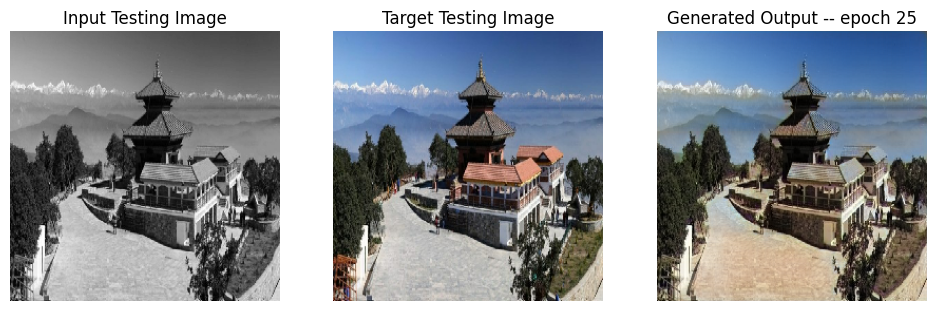

SSIM Score: 0.969100296497345
PSNR Score: 26.042707443237305
Epoch 25
Training Details
Generator-- total_loss:15.35518 gan_loss:11.33232 l1_loss:0.03541 perceptual_loss:0.00602 Discriminator-- total_loss:0.00258 real_loss:0.00182 generated_loss:0.00075 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 26 is 413.16744089126587 sec
Number of iteration 525
Validation Details
Generator-- total_loss:5.14232 gan_loss:0.21093 l1_loss:0.04227  perceptual_loss:0.00880 Discriminator-- total_loss:3.73144 real_loss:3.54450 generated_loss:0.18694 --- SSIM 0.94200 PSNR 22.84392 LPIPS 0.00000
Time taken for epoch 26 is 459.94908618927 sec
Number of iteration 70
Epoch 26
Training Details
Generator-- total_loss:16.15502 gan_loss:12.10944 l1_loss:0.03560 perceptual_loss:0.00607 Discriminator-- total_loss:0.00089 real_loss:0.00048 generated_loss:0.00042 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 27 is 442.090087890625 sec
Number of iteration 525
Validation Details
Gen

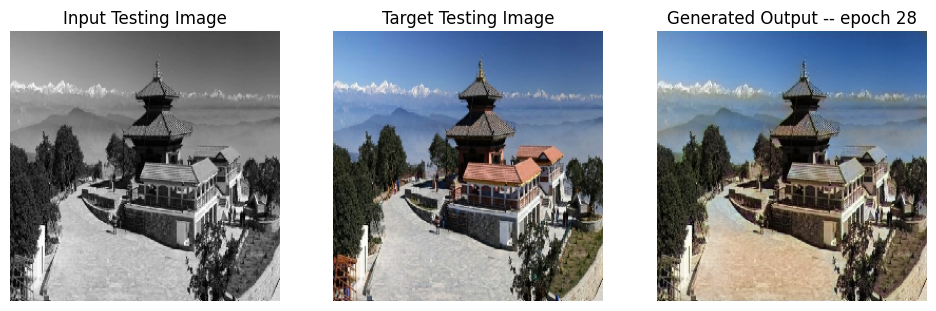

SSIM Score: 0.9690400958061218
PSNR Score: 25.9559383392334
Epoch 28
Training Details
Generator-- total_loss:16.01618 gan_loss:11.98531 l1_loss:0.03546 perceptual_loss:0.00606 Discriminator-- total_loss:0.00289 real_loss:0.00190 generated_loss:0.00100 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 29 is 411.774658203125 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.95233 gan_loss:0.04167 l1_loss:0.04205  perceptual_loss:0.00882 Discriminator-- total_loss:5.98098 real_loss:5.96708 generated_loss:0.01390 --- SSIM 0.94221 PSNR 22.88852 LPIPS 0.00000
Time taken for epoch 29 is 458.3947420120239 sec
Number of iteration 70
Epoch 29
Training Details
Generator-- total_loss:17.38580 gan_loss:13.34444 l1_loss:0.03558 perceptual_loss:0.00604 Discriminator-- total_loss:0.00005 real_loss:0.00004 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 30 is 411.8427851200104 sec
Number of iteration 525
Validation Details
Gen

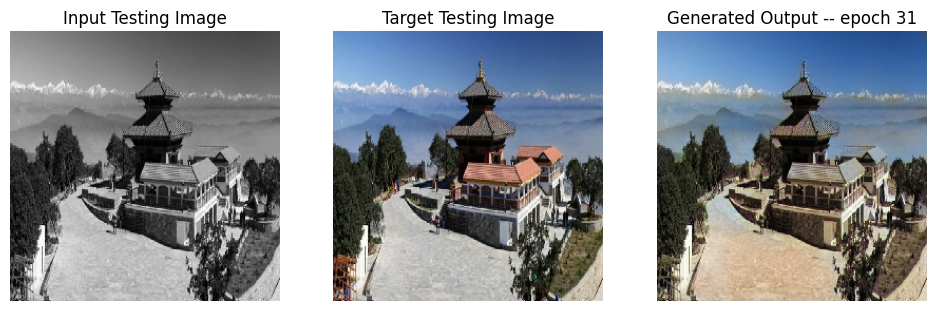

SSIM Score: 0.9689581394195557
PSNR Score: 25.977638244628906
Reduced generator learning rate to 0.0004500000213738531 at epoch 31
Epoch 31
Training Details
Generator-- total_loss:3.75592 gan_loss:0.04885 l1_loss:0.03263 perceptual_loss:0.00555 Discriminator-- total_loss:49.18759 real_loss:49.18758 generated_loss:0.00002 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 32 is 547.5398137569427 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.42522 gan_loss:0.00000 l1_loss:0.03765  perceptual_loss:0.00825 Discriminator-- total_loss:41.43052 real_loss:41.43052 generated_loss:0.00000 --- SSIM 0.95117 PSNR 24.58365 LPIPS 0.00000
Time taken for epoch 32 is 593.9815118312836 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:3.65434 gan_loss:0.00000 l1_loss:0.03222 perceptual_loss:0.00541 Discriminator-- total_loss:49.67645 real_loss:49.67644 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 

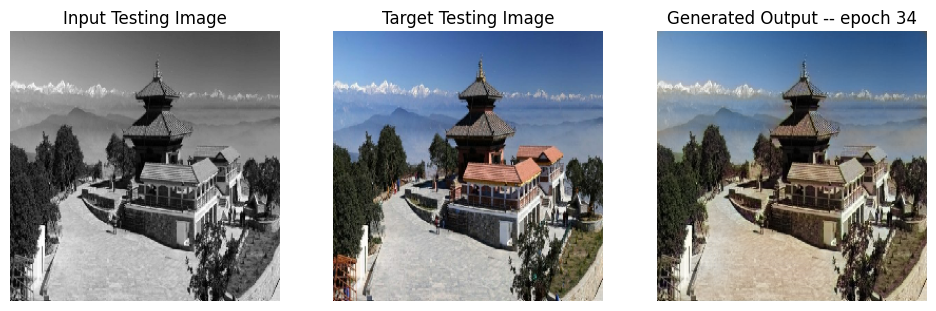

SSIM Score: 0.973055362701416
PSNR Score: 26.920604705810547
Epoch 34
Training Details
Generator-- total_loss:3.62058 gan_loss:0.00000 l1_loss:0.03191 perceptual_loss:0.00536 Discriminator-- total_loss:49.34497 real_loss:49.34497 generated_loss:0.00000 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 35 is 545.9691078662872 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.65356 gan_loss:0.00000 l1_loss:0.03969  perceptual_loss:0.00856 Discriminator-- total_loss:41.70831 real_loss:41.70831 generated_loss:0.00000 --- SSIM 0.94978 PSNR 24.26378 LPIPS 0.00000
Time taken for epoch 35 is 591.7915878295898 sec
Number of iteration 70
Epoch 35
Training Details
Generator-- total_loss:3.64069 gan_loss:0.00000 l1_loss:0.03209 perceptual_loss:0.00540 Discriminator-- total_loss:48.90742 real_loss:48.90738 generated_loss:0.00004 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 36 is 542.9732131958008 sec
Number of iteration 525
Validation Details

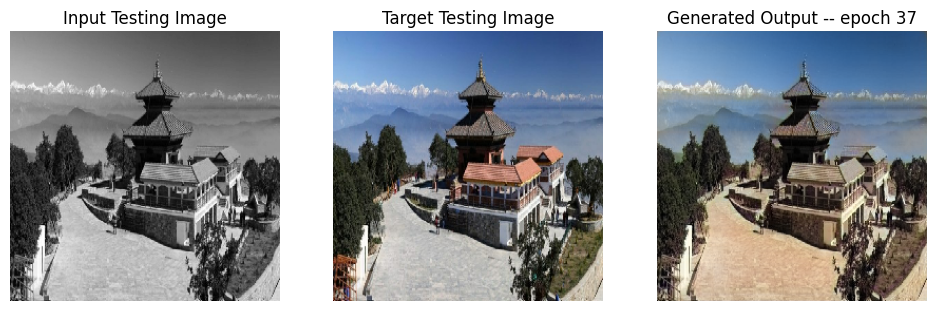

SSIM Score: 0.9711621403694153
PSNR Score: 25.39369010925293
Epoch 37
Training Details
Generator-- total_loss:3.63543 gan_loss:0.00000 l1_loss:0.03206 perceptual_loss:0.00537 Discriminator-- total_loss:48.18062 real_loss:48.18061 generated_loss:0.00000 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 38 is 546.3084192276001 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.47073 gan_loss:0.00000 l1_loss:0.03822  perceptual_loss:0.00811 Discriminator-- total_loss:39.88950 real_loss:39.88950 generated_loss:0.00000 --- SSIM 0.95090 PSNR 24.48696 LPIPS 0.00000
Time taken for epoch 38 is 592.5409543514252 sec
Number of iteration 70
Epoch 38
Training Details
Generator-- total_loss:3.63571 gan_loss:0.00000 l1_loss:0.03209 perceptual_loss:0.00534 Discriminator-- total_loss:47.91204 real_loss:47.91204 generated_loss:0.00000 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 39 is 545.7562696933746 sec
Number of iteration 525
Validation Details

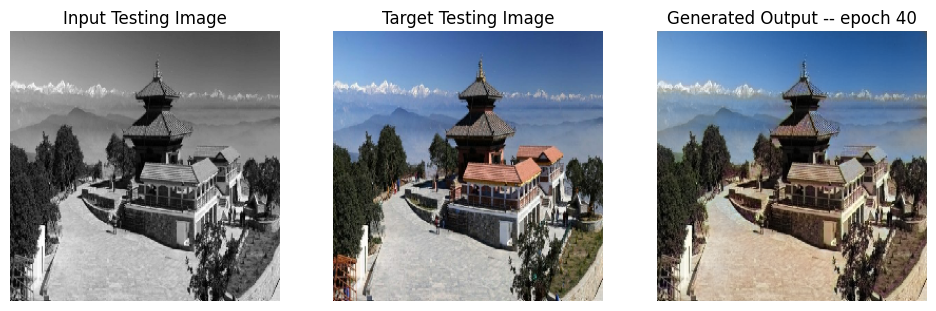

SSIM Score: 0.9708089828491211
PSNR Score: 26.66085433959961
Epoch 40
Training Details
Generator-- total_loss:17.57844 gan_loss:13.95750 l1_loss:0.03197 perceptual_loss:0.00530 Discriminator-- total_loss:0.03407 real_loss:0.01682 generated_loss:0.01725 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 41 is 413.2667591571808 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.33722 gan_loss:0.00842 l1_loss:0.03702  perceptual_loss:0.00783 Discriminator-- total_loss:6.68541 real_loss:6.63352 generated_loss:0.05189 --- SSIM 0.95120 PSNR 24.65173 LPIPS 0.00000
Time taken for epoch 41 is 459.7925055027008 sec
Number of iteration 70
Epoch 41
Training Details
Generator-- total_loss:18.80358 gan_loss:15.21138 l1_loss:0.03172 perceptual_loss:0.00526 Discriminator-- total_loss:0.00176 real_loss:0.00083 generated_loss:0.00093 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 42 is 412.4151210784912 sec
Number of iteration 525
Validation Details
G

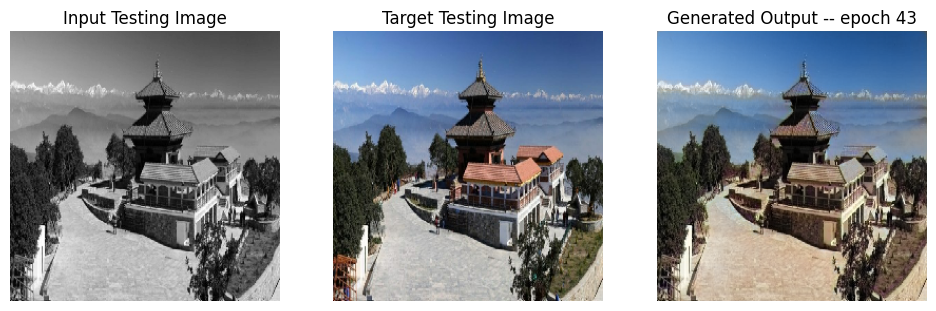

SSIM Score: 0.9709685444831848
PSNR Score: 26.68503761291504
Reduced generator learning rate to 0.0002025000096182339 at epoch 43
Epoch 43
Training Details
Generator-- total_loss:3.61950 gan_loss:0.00662 l1_loss:0.03186 perceptual_loss:0.00534 Discriminator-- total_loss:13.14596 real_loss:13.14595 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 44 is 543.0594584941864 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.64083 gan_loss:0.00002 l1_loss:0.03988  perceptual_loss:0.00816 Discriminator-- total_loss:16.27450 real_loss:16.27449 generated_loss:0.00001 --- SSIM 0.95021 PSNR 24.13665 LPIPS 0.00000
Time taken for epoch 44 is 589.5659589767456 sec
Number of iteration 70
Epoch 44
Training Details
Generator-- total_loss:3.58199 gan_loss:0.00156 l1_loss:0.03158 perceptual_loss:0.00529 Discriminator-- total_loss:12.95654 real_loss:12.95654 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 4

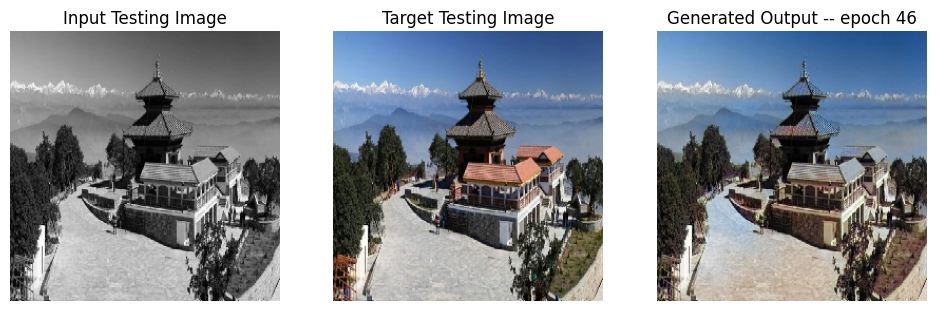

SSIM Score: 0.9724807143211365
PSNR Score: 27.66581153869629
Epoch 46
Training Details
Generator-- total_loss:3.56422 gan_loss:0.00159 l1_loss:0.03143 perceptual_loss:0.00525 Discriminator-- total_loss:13.22834 real_loss:13.22833 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 47 is 543.665266752243 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.41153 gan_loss:0.00002 l1_loss:0.03789  perceptual_loss:0.00778 Discriminator-- total_loss:16.48198 real_loss:16.48197 generated_loss:0.00001 --- SSIM 0.94933 PSNR 24.39377 LPIPS 0.00000
Time taken for epoch 47 is 589.9265475273132 sec
Number of iteration 70
Epoch 47
Training Details
Generator-- total_loss:3.56189 gan_loss:0.00115 l1_loss:0.03142 perceptual_loss:0.00523 Discriminator-- total_loss:12.83280 real_loss:12.83279 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 48 is 544.308331489563 sec
Number of iteration 525
Validation Details
G

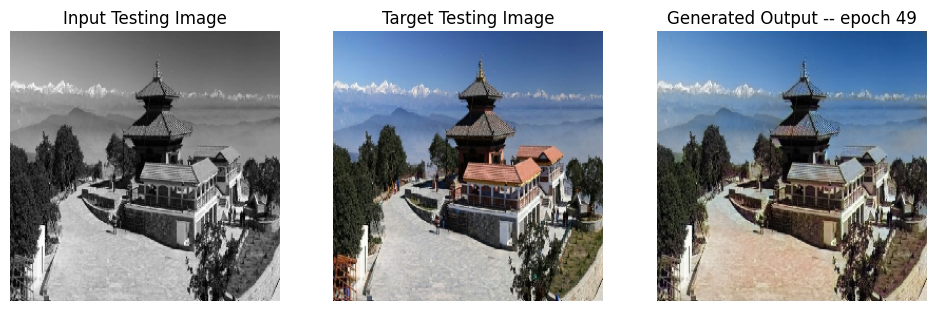

SSIM Score: 0.9715413451194763
PSNR Score: 26.482677459716797
Epoch 49
Training Details
Generator-- total_loss:3.56569 gan_loss:0.00146 l1_loss:0.03149 perceptual_loss:0.00519 Discriminator-- total_loss:13.20013 real_loss:13.20012 generated_loss:0.00001 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 50 is 544.0351746082306 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.50888 gan_loss:0.00002 l1_loss:0.03885  perceptual_loss:0.00780 Discriminator-- total_loss:16.21608 real_loss:16.21607 generated_loss:0.00001 --- SSIM 0.95066 PSNR 24.36993 LPIPS 0.00000
Time taken for epoch 50 is 590.5658159255981 sec
Number of iteration 70
Reduced discriminator learning rate to 9.000000427477062e-05 at epoch 50.
Epoch 50
Training Details
Generator-- total_loss:10.86135 gan_loss:7.30489 l1_loss:0.03138 perceptual_loss:0.00523 Discriminator-- total_loss:0.22634 real_loss:0.14602 generated_loss:0.08032 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for ep

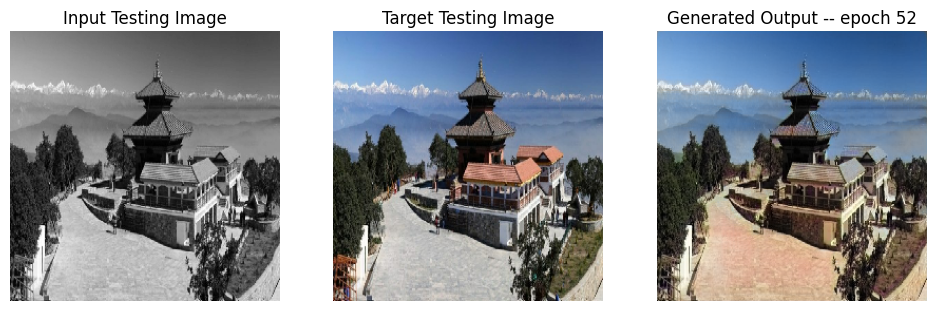

SSIM Score: 0.9704793095588684
PSNR Score: 25.356971740722656
Epoch 52
Training Details
Generator-- total_loss:13.14495 gan_loss:9.60157 l1_loss:0.03128 perceptual_loss:0.00520 Discriminator-- total_loss:0.04703 real_loss:0.02170 generated_loss:0.02532 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 53 is 411.435334444046 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.35851 gan_loss:0.05616 l1_loss:0.03691  perceptual_loss:0.00764 Discriminator-- total_loss:4.74191 real_loss:4.58928 generated_loss:0.15264 --- SSIM 0.95095 PSNR 24.69795 LPIPS 0.00000
Time taken for epoch 53 is 457.5178813934326 sec
Number of iteration 70
Epoch 53
Training Details
Generator-- total_loss:13.47866 gan_loss:9.94647 l1_loss:0.03118 perceptual_loss:0.00518 Discriminator-- total_loss:0.04187 real_loss:0.01607 generated_loss:0.02580 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 54 is 407.4551362991333 sec
Number of iteration 525
Validation Details
Gen

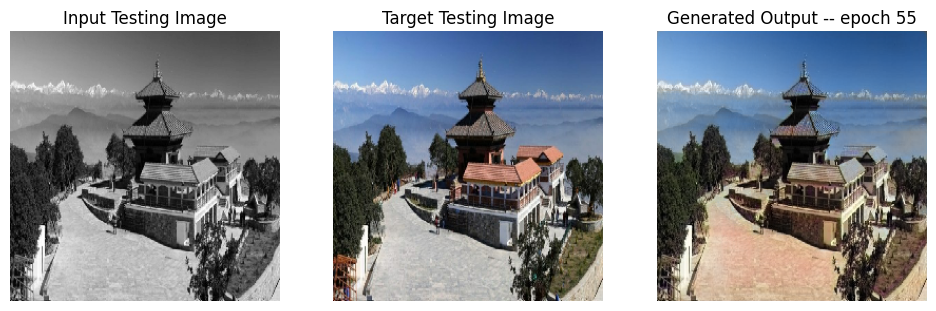

SSIM Score: 0.9705306887626648
PSNR Score: 25.44318962097168
Epoch 55
Training Details
Generator-- total_loss:15.19953 gan_loss:11.64154 l1_loss:0.03142 perceptual_loss:0.00520 Discriminator-- total_loss:0.01338 real_loss:0.00574 generated_loss:0.00764 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 56 is 404.2238688468933 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.30279 gan_loss:0.01696 l1_loss:0.03677  perceptual_loss:0.00761 Discriminator-- total_loss:5.78861 real_loss:5.76709 generated_loss:0.02152 --- SSIM 0.95120 PSNR 24.71642 LPIPS 0.00000
Time taken for epoch 56 is 449.41096568107605 sec
Number of iteration 70
Reduced generator learning rate to 9.11250062927138e-05 at epoch 56
Epoch 56
Training Details
Generator-- total_loss:3.70146 gan_loss:0.03309 l1_loss:0.03234 perceptual_loss:0.00543 Discriminator-- total_loss:8.37226 real_loss:8.36884 generated_loss:0.00341 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 57 is

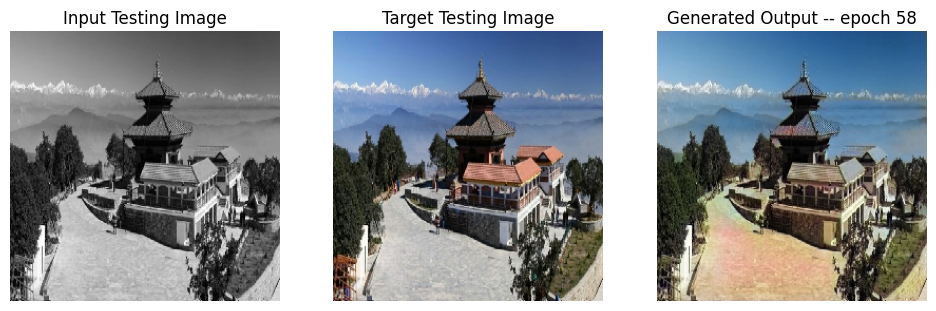

SSIM Score: 0.9676566123962402
PSNR Score: 24.560321807861328
Epoch 58
Training Details
Generator-- total_loss:3.62584 gan_loss:0.01324 l1_loss:0.03187 perceptual_loss:0.00532 Discriminator-- total_loss:8.19500 real_loss:8.18910 generated_loss:0.00590 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 59 is 539.3347454071045 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.31596 gan_loss:0.00095 l1_loss:0.03690  perceptual_loss:0.00782 Discriminator-- total_loss:9.95311 real_loss:9.95251 generated_loss:0.00060 --- SSIM 0.95028 PSNR 24.57466 LPIPS 0.00000
Time taken for epoch 59 is 584.7931609153748 sec
Number of iteration 70
Epoch 59
Training Details
Generator-- total_loss:3.61467 gan_loss:0.01270 l1_loss:0.03179 perceptual_loss:0.00529 Discriminator-- total_loss:7.95735 real_loss:7.95160 generated_loss:0.00575 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 60 is 537.9436256885529 sec
Number of iteration 525
Validation Details
Gene

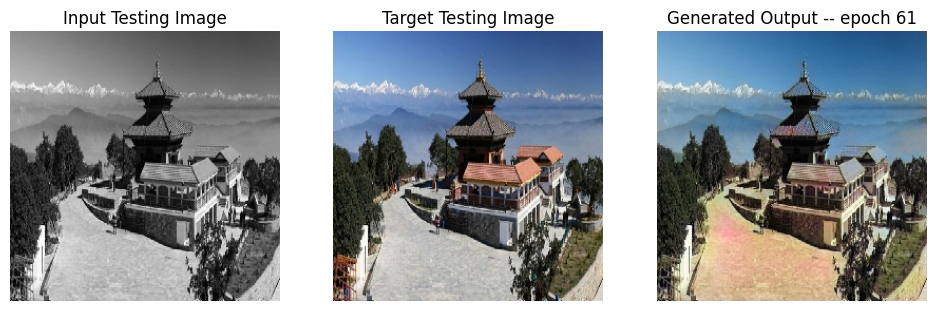

SSIM Score: 0.9657805562019348
PSNR Score: 24.262121200561523
Epoch 61
Training Details
Generator-- total_loss:3.62368 gan_loss:0.01105 l1_loss:0.03187 perceptual_loss:0.00532 Discriminator-- total_loss:7.75915 real_loss:7.75659 generated_loss:0.00256 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 62 is 540.1245138645172 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.39587 gan_loss:0.00101 l1_loss:0.03768  perceptual_loss:0.00784 Discriminator-- total_loss:9.94843 real_loss:9.94778 generated_loss:0.00065 --- SSIM 0.94937 PSNR 24.37047 LPIPS 0.00000
Time taken for epoch 62 is 585.8329162597656 sec
Number of iteration 70
Epoch 62
Training Details
Generator-- total_loss:3.60537 gan_loss:0.01113 l1_loss:0.03169 perceptual_loss:0.00531 Discriminator-- total_loss:7.65971 real_loss:7.65547 generated_loss:0.00424 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 63 is 539.9646782875061 sec
Number of iteration 525
Validation Details
Gene

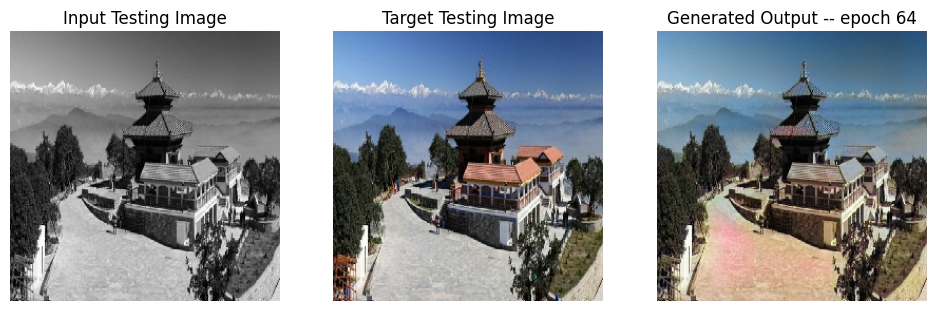

SSIM Score: 0.9669491648674011
PSNR Score: 24.81849479675293
Reduced discriminator learning rate to 2.700000040931627e-05 at epoch 64.
Epoch 64
Training Details
Generator-- total_loss:7.01409 gan_loss:3.42540 l1_loss:0.03166 perceptual_loss:0.00528 Discriminator-- total_loss:0.37841 real_loss:0.19969 generated_loss:0.17872 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 65 is 404.9010925292969 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.74455 gan_loss:0.39204 l1_loss:0.03732  perceptual_loss:0.00775 Discriminator-- total_loss:1.93856 real_loss:1.61539 generated_loss:0.32316 --- SSIM 0.94939 PSNR 24.46780 LPIPS 0.00000
Time taken for epoch 65 is 451.18761944770813 sec
Number of iteration 70
Epoch 65
Training Details
Generator-- total_loss:7.75464 gan_loss:4.17631 l1_loss:0.03156 perceptual_loss:0.00528 Discriminator-- total_loss:0.16581 real_loss:0.06946 generated_loss:0.09635 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 6

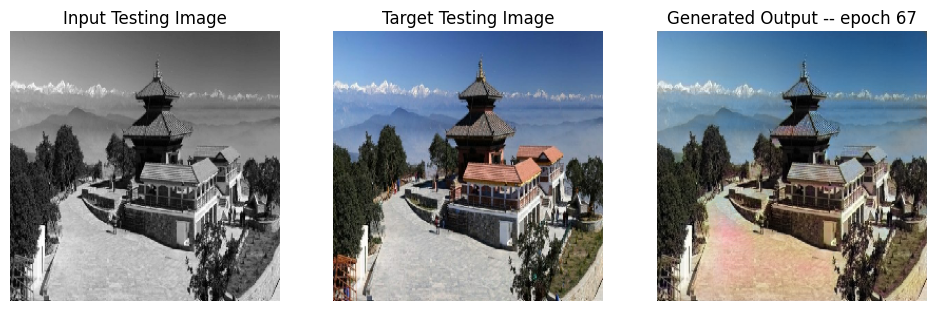

SSIM Score: 0.9686183929443359
PSNR Score: 25.21945571899414
Epoch 67
Training Details
Generator-- total_loss:8.93825 gan_loss:5.34177 l1_loss:0.03172 perceptual_loss:0.00531 Discriminator-- total_loss:0.08411 real_loss:0.03563 generated_loss:0.04848 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 68 is 404.3152403831482 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.74144 gan_loss:0.40497 l1_loss:0.03714  perceptual_loss:0.00778 Discriminator-- total_loss:2.05560 real_loss:1.71938 generated_loss:0.33622 --- SSIM 0.94968 PSNR 24.49549 LPIPS 0.00000
Time taken for epoch 68 is 450.04969000816345 sec
Number of iteration 70
Reduced generator learning rate to 4.100625446881168e-05 at epoch 68
Epoch 68
Training Details
Generator-- total_loss:3.81165 gan_loss:0.08316 l1_loss:0.03296 perceptual_loss:0.00541 Discriminator-- total_loss:5.93736 real_loss:5.88281 generated_loss:0.05454 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 69 is 

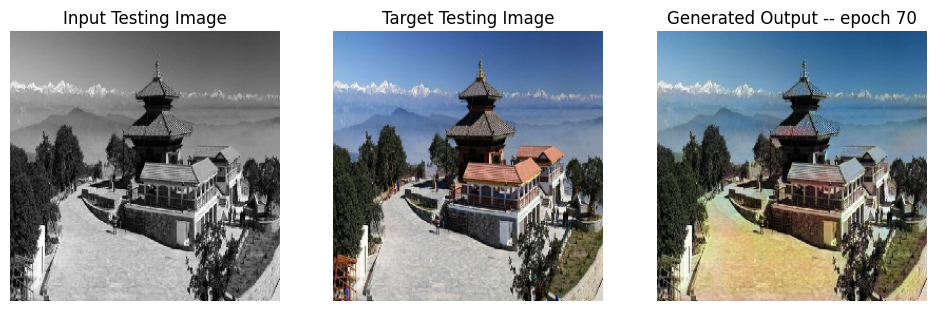

SSIM Score: 0.9648135304450989
PSNR Score: 23.59137725830078
Epoch 70
Training Details
Generator-- total_loss:3.74939 gan_loss:0.03480 l1_loss:0.03284 perceptual_loss:0.00538 Discriminator-- total_loss:7.20963 real_loss:7.15935 generated_loss:0.05028 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 71 is 538.7165269851685 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.48947 gan_loss:0.01076 l1_loss:0.03846  perceptual_loss:0.00790 Discriminator-- total_loss:7.48878 real_loss:7.48045 generated_loss:0.00833 --- SSIM 0.94756 PSNR 24.14320 LPIPS 0.00000
Time taken for epoch 71 is 583.9188103675842 sec
Number of iteration 70
Epoch 71
Training Details
Generator-- total_loss:3.70391 gan_loss:0.03251 l1_loss:0.03241 perceptual_loss:0.00537 Discriminator-- total_loss:7.43727 real_loss:7.38644 generated_loss:0.05083 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 72 is 538.5145285129547 sec
Number of iteration 525
Validation Details
Gener

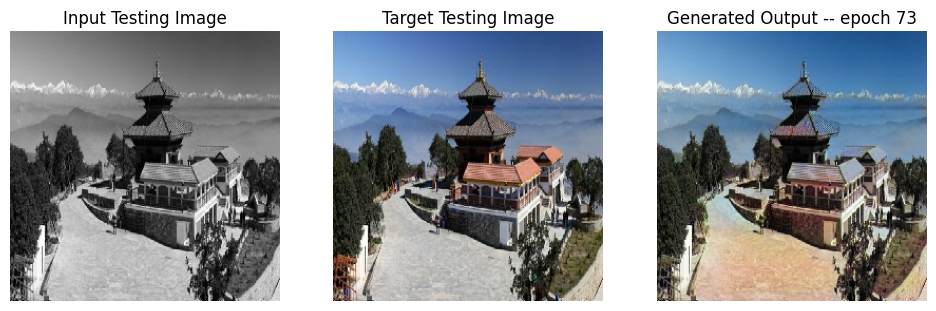

SSIM Score: 0.9682412147521973
PSNR Score: 25.124135971069336
Epoch 73
Training Details
Generator-- total_loss:3.69874 gan_loss:0.02810 l1_loss:0.03244 perceptual_loss:0.00534 Discriminator-- total_loss:7.52072 real_loss:7.47344 generated_loss:0.04728 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 74 is 539.2975172996521 sec
Number of iteration 525
Validation Details
Generator-- total_loss:4.49292 gan_loss:0.01052 l1_loss:0.03851  perceptual_loss:0.00789 Discriminator-- total_loss:7.82408 real_loss:7.81523 generated_loss:0.00885 --- SSIM 0.94743 PSNR 24.14028 LPIPS 0.00000
Time taken for epoch 74 is 584.3875198364258 sec
Number of iteration 70
Epoch 74
Training Details
Generator-- total_loss:3.69287 gan_loss:0.02847 l1_loss:0.03236 perceptual_loss:0.00535 Discriminator-- total_loss:7.51358 real_loss:7.46326 generated_loss:0.05031 --- SSIM 0.00000 PSNR 0.00000 LPIPS 0.00000
Time taken for epoch 75 is 539.8090980052948 sec
Number of iteration 525
Validation Details
Gene

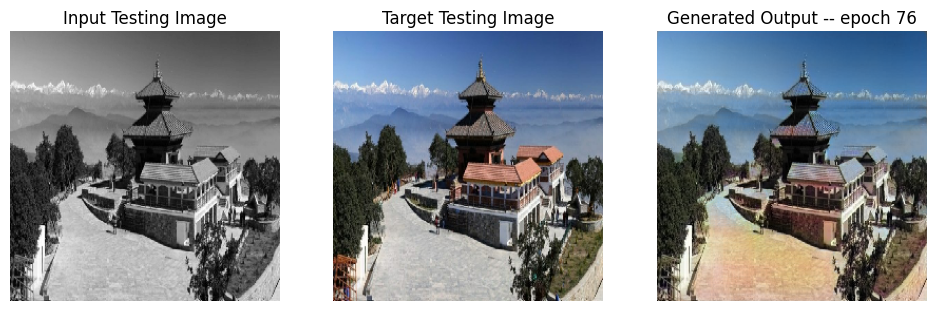

SSIM Score: 0.9680138230323792
PSNR Score: 24.79507064819336
Reduced discriminator learning rate to 8.100000013655517e-06 at epoch 76.


In [50]:
fit(train_dataset, epochs, validation_dataset, gen)

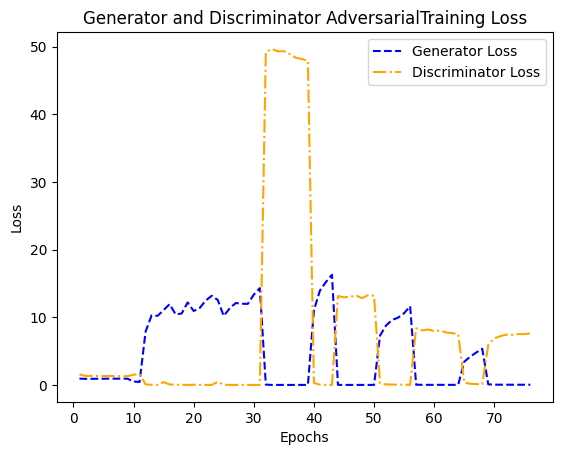

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

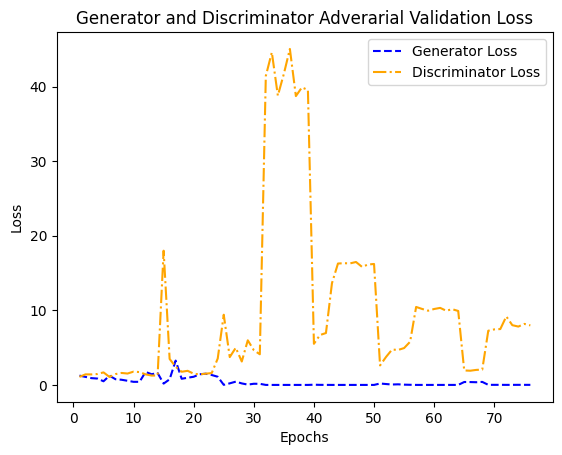

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

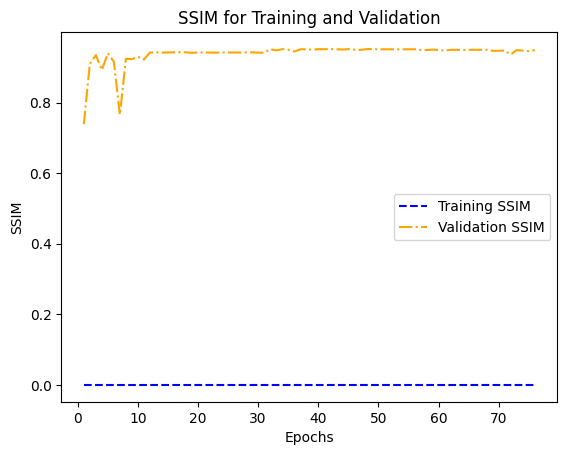

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

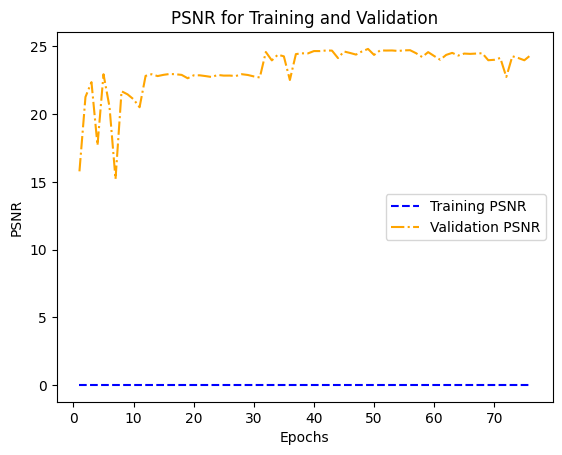

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

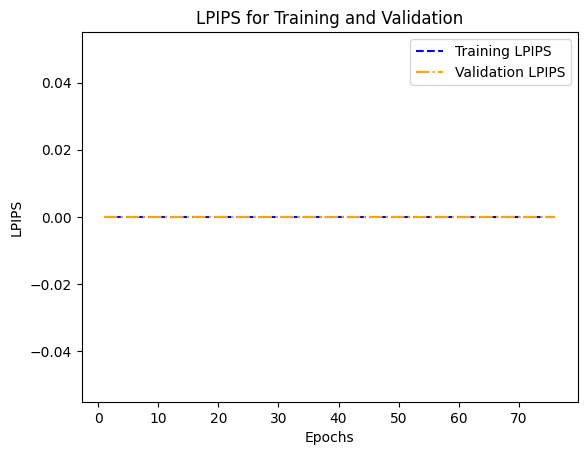

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

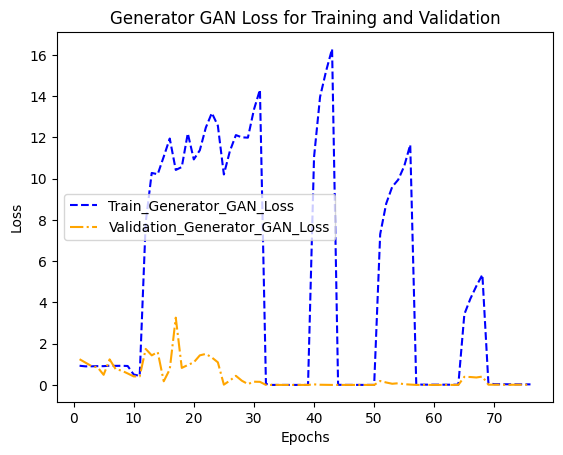

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

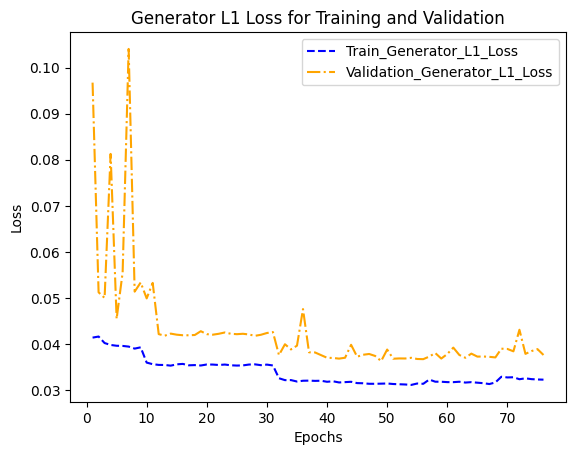

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

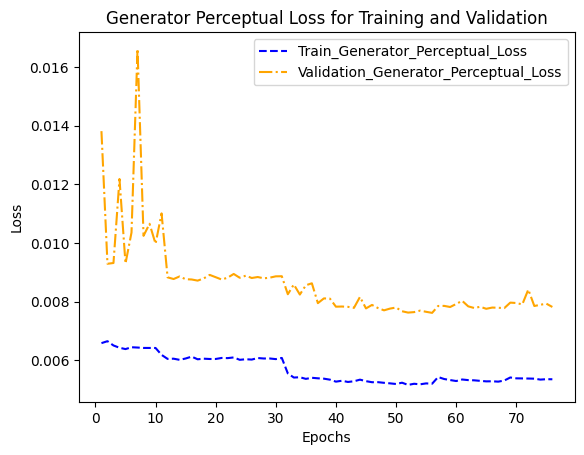

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

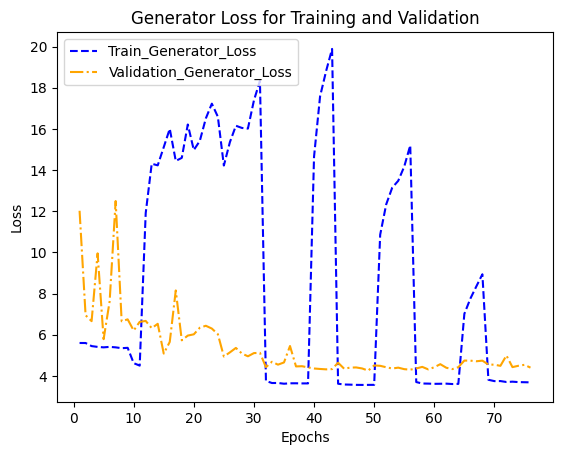

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

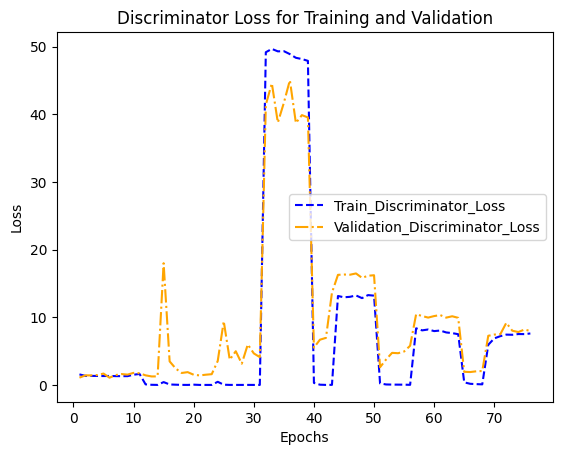

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

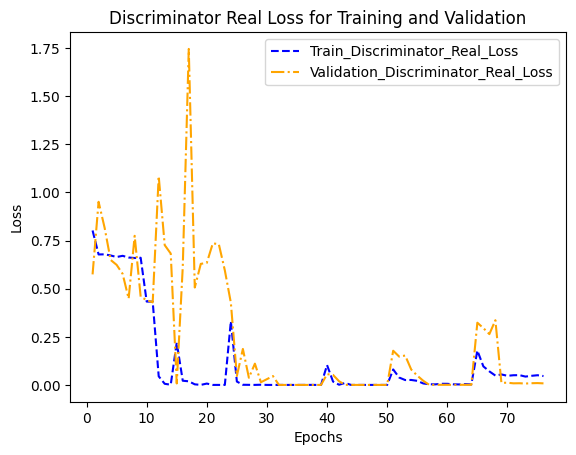

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

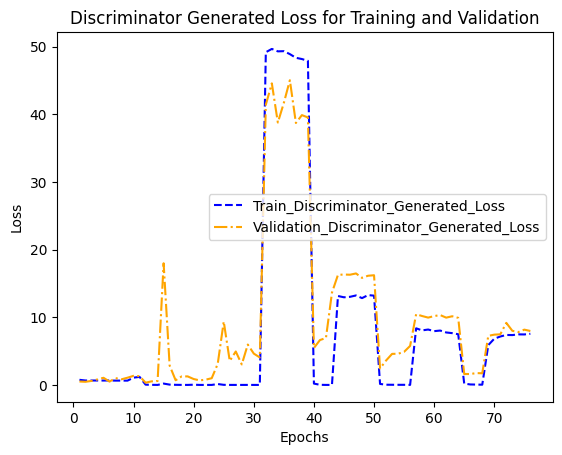

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb27')

In [66]:
gen.save('/kaggle/working/modelsFeb27/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb27/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb27/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb27/disc_weight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip